**XAI Lib**: https://github.com/kdd-lab/XAI-Lib/tree/kode-refactoring <br>
This Jupyter is revised from (and other examples can be found at): https://github.com/pellungrobe/XAI_course_2024 

In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn import metrics
from sklearn.model_selection import train_test_split, cross_val_score 
from sklearn.metrics import roc_curve, auc, roc_auc_score, accuracy_score, f1_score, classification_report
from sklearn.model_selection import train_test_split

In [2]:
# assicurati di avere il repo in sys.path e di rimuovere i moduli caricati
import sys, os
repo_path = r'C:\Users\david\RuleTree'
if repo_path not in sys.path:
    sys.path.insert(0, repo_path)
for _m in list(sys.modules):
    if _m == 'RuleTree' or _m.startswith('RuleTree.'):
        del sys.modules[_m]

We shall use a curated version of the COMPAS dataset <br>
https://raw.githubusercontent.com/PacktPublishing/Interpretable-Machine-Learning-with-Python/master/datasets/recidivism-risk_odsc.csv

We will use explanation methods to understand if there is something wrong with a model trained on this data.

## Data Prep


In [3]:
filename = '../datasets/CLF/recidivism-risk_odsc.csv'
compas = pd.read_csv(filename)

In [4]:
compas

,sex,age,race,juv_fel_count,juv_misd_count,juv_other_count,priors_count,c_charge_degree,compas_score,did_recid
0,Male,69,Other,0,0,0,0,(F3),0,0
1,Male,69,Other,0,0,0,0,(F3),0,0
2,Male,34,African-American,0,0,0,0,(F3),0,1
3,Male,24,African-American,0,0,1,4,(F3),0,1
4,Male,24,African-American,0,0,1,4,(F3),0,1
...,...,...,...,...,...,...,...,...,...,...
14783,Female,31,African-American,0,0,0,5,(M1),1,0
14784,Male,57,Other,0,0,0,0,(F2),0,0
14785,Female,33,African-American,0,0,0,3,(M1),0,0
14786,Female,23,Hispanic,0,0,0,2,(F3),0,1


Compare the ground truth of whether defendents did recidivate (did_recid) versus the prediction for medium/high risk of recidivisim (compas_score).

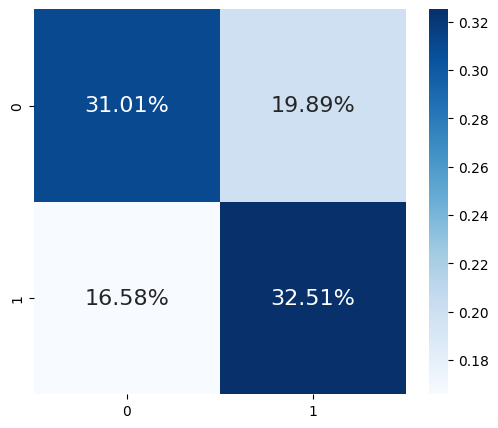

In [5]:
conf_matrix = metrics.confusion_matrix(compas.did_recid,\
                                     compas.compas_score)

#Plot the confusion matrix with percetage formatting.
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix/np.sum(conf_matrix), annot=True,\
            fmt='.2%', cmap='Blues', annot_kws={'size':16})
plt.show()

COMPAS model's predictive performance is not very good, especially if we assume that criminal justice decision-makers are taking medium or high-risk assessments at face value.It also tells false positives and negatives occur at a similar rate. Nevertheless, simple visualizations like the confusion matrix above obscure predictive disparities between subgroups of a population.

In [6]:
compas_caucasian = compas[compas.race == 'Caucasian']
compas_african = compas[compas.race == 'African-American']


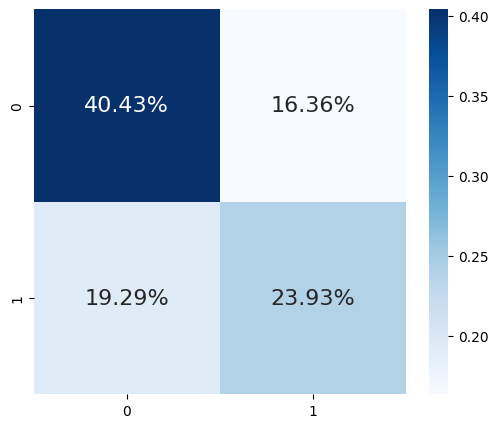

In [7]:
conf_matrix = metrics.confusion_matrix(compas_caucasian.did_recid,\
                                     compas_caucasian.compas_score)

#Plot the confusion matrix with percetage formatting.
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix/np.sum(conf_matrix), annot=True,\
            fmt='.2%', cmap='Blues', annot_kws={'size':16})
plt.show()

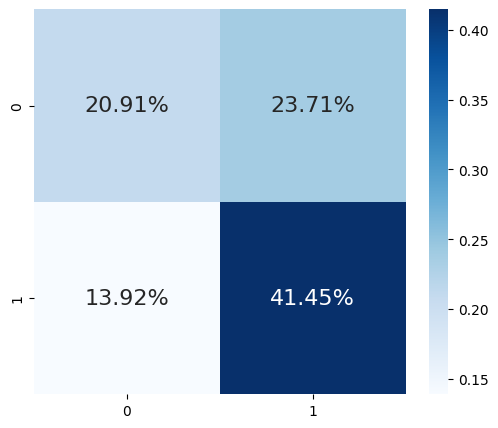

In [8]:
conf_matrix = metrics.confusion_matrix(compas_african.did_recid,\
                                     compas_african.compas_score)

#Plot the confusion matrix with percetage formatting.
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix/np.sum(conf_matrix), annot=True,\
            fmt='.2%', cmap='Blues', annot_kws={'size':16})
plt.show()

There are many disparities between both confusion matrices but unfairness relates more to False Positives (top right quadrant) than False Negatives (bottom left quadrant).

If we wanted to convey the level of unfairness succinctly as a single metric, we could do so with False Positive Rates which is the ratio between false positives over all those those that were negative (according to ground truth). African-American's are 84% more likely to be falsely predicted to be of risk than Caucasians.

Let us now generate the necessary dummy variables and train/test

In [9]:
compas2 = compas.copy()
compas2 = pd.get_dummies(compas2
               ,columns = ['c_charge_degree','race','sex'])

In [10]:
rand = 9
os.environ['PYTHONHASHSEED']=str(rand)
np.random.seed(rand)

#Create `X` and `y` and split them 80/20 corresponding for train/test.
y = compas2['compas_score']
X = compas2.drop(['compas_score', 'did_recid'], axis=1).copy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rand)

I will use catboost as model, since it has better performances on this data.

In [11]:
import catboost as cb

In [12]:
cb_mdl = cb.CatBoostClassifier(learning_rate=0.5, depth=7, random_seed=rand)

#Train Model
fitted_cb_mdl = cb_mdl.fit(X_train, y_train, verbose=False, plot=False)

#Evaluate Model
y_predt = fitted_cb_mdl.predict(X_train)
print(classification_report(y_train, y_predt))

y_pred = fitted_cb_mdl.predict(X_test)
print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      5662
           1       0.89      0.87      0.88      6168

    accuracy                           0.88     11830
   macro avg       0.88      0.88      0.88     11830
weighted avg       0.88      0.88      0.88     11830

Accuracy 0.8103448275862069
F1-score 0.8210526315789474
              precision    recall  f1-score   support

           0       0.79      0.81      0.80      1376
           1       0.83      0.81      0.82      1582

    accuracy                           0.81      2958
   macro avg       0.81      0.81      0.81      2958
weighted avg       0.81      0.81      0.81      2958



In [13]:

from RuleTree.stumps.classification.MofNTrepanStumpClassifier import MofNTrepanStumpClassifier

c:\Users\david\anaconda3\envs\dm2_pytorch\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# importa la classe direttamente dal file
from RuleTree.tree.TrepanClassifier import TrepanClassifier
    
trepan_clf = TrepanClassifier(estimator = cb_mdl, s_min=1000, base_stumps=[MofNTrepanStumpClassifier()], random_state=42)
    
trepan_clf.fit(X_train, y_train)
y_pred_trepan = trepan_clf.predict(X_test.values)
y_pred = trepan_clf.oracle.predict(X_test.values)
print("Traduzione Trepan")
print('Accuracy %s' % accuracy_score(y_test, y_pred_trepan))
print('F1-score %s' % f1_score(y_test, y_pred_trepan, average=None))
print(classification_report(y_test, y_pred_trepan))
fidelty = accuracy_score(y_pred, y_pred_trepan)
print("Fidelity of Trepan to the original model:", fidelty)

In [ ]:
attributes = X.columns
trepan_clf.print_trepan_rules(feature_names=attributes)


  REGOLE GLOBALI ESTRATTE DA TREPAN
REGOLA 1 [Nodo ID: Rllll]:
  IF  (2-of-{ priors_count <= 8, age > 21.0, race_African-American == 0 }}) AND 
      (3-of-{ priors_count <= 23, juv_misd_count != 4, c_charge_degree_(CO3) == 0 }}) AND 
      (3-of-{ priors_count <= 1, age > 24.0, c_charge_degree_(MO3) == 0 }}) AND 
      (2-of-{ juv_other_count == 2, age > 25.0 }})
  THEN Predizione = 1
  [Fedeltà: 0.00%, Copertura: 1.50%]

REGOLA 2 [Nodo ID: Rlllrlllllll]:
  IF  (2-of-{ priors_count <= 8, age > 21.0, race_African-American == 0 }}) AND 
      (3-of-{ priors_count <= 23, juv_misd_count != 4, c_charge_degree_(CO3) == 0 }}) AND 
      (3-of-{ priors_count <= 1, age > 24.0, c_charge_degree_(MO3) == 0 }}) AND 
      (NOT (2-of-{ juv_other_count == 2, age > 25.0 }})) AND 
      (2-of-{ age <= 58, race_African-American != 0, c_charge_degree_(F7) == 0 }}) AND 
      (1-of-{ c_charge_degree_(F7) == 0, age <= 26.0, sex_Female != 0 }}) AND 
      (2-of-{ juv_fel_count == 0, age > 27.0, race_Nativ

In [ ]:
def refit_complexity(results):
    scores = results["mean_test_score"]
    params = results["params"]

    def normalize_complexity(param_value):
        return 1000 if param_value is None else param_value

    best_index = None
    best_value = -float("inf")
    for i, (score, p) in enumerate(zip(scores, params)):
        complexity = normalize_complexity(p["max_leaf_nodes"]) + normalize_complexity(p["max_depth"])
        value = score - 0.001 * complexity
        if value > best_value:
            best_value = value
            best_index = i
    return best_index

def refit_simple(results):
    scores = results["mean_test_score"]
    params = results["params"]

    def normalize_complexity(param_value):
        return 1000 if param_value is None else param_value

    best_score = max(scores)
    best_indices = [i for i, s in enumerate(scores) if s >= best_score - 1e-6]

    best_index = min(
        best_indices,
        key=lambda i: normalize_complexity(params[i]["max_leaf_nodes"])
    )
    return best_index

In [ ]:
# 1. Definisci lo spazio di ricerca (i parametri della classe TrepanClassifier)
param_grid = {
    'max_leaf_nodes': [5,10,15,20],
    's_min': [10, 50, 100, 200]
}

# 2. Inizializza il classificatore base
# Passiamo una callable che invoca il RandomForest già addestrato `rd`.
# In questo modo `sklearn.clone` non rimuove lo stato fitted e le copie
# usate da GridSearch chiameranno comunque il `predict` del modello addestrato.
tr_base = TrepanClassifier(estimator=(lambda X, _rd=cb_mdl: _rd.predict(X)), base_stumps=[MofNTrepanStumpClassifier(max_conditions=3)], random_state=42)

In [ ]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold

In [ ]:
# 3. Configura la GridSearchCV
grid_search = GridSearchCV(
    estimator=tr_base,
    param_grid=param_grid,
    scoring='accuracy',  # Userà l'accuratezza, ma truccata!
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    refit=refit_simple,
    n_jobs=-1,           # Usa tutti i core del PC per fare in fretta
    verbose=2,
    error_score='raise'
)

# 4. IL TRUCCO: Generiamo le "etichette oracolo" per l'addestramento
oracle_y_train = trepan_clf.oracle.predict(X_train)
# 5. Addestriamo la GridSearch puntando alla FEDELTÀ
print("Avvio GridSearch per massimizzare la Fedeltà...")
grid_search.fit(X_train, oracle_y_train)


Avvio GridSearch per massimizzare la Fedeltà...
Fitting 5 folds for each of 16 candidates, totalling 80 fits


KeyError: "None of [Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,\n       ...\n       2356, 2357, 2358, 2359, 2360, 2361, 2362, 2363, 2364, 2365],\n      dtype='int64', length=2366)] are in the [columns]"

In [ ]:
print("\n🏆 MIGLIORI PARAMETRI TROVATI:", grid_search.best_params_)
best_score = grid_search.cv_results_["mean_test_score"][grid_search.best_index_]
print(f"🏆 FEDELTÀ STIMATA (CV) DEL PARAMETRO SELEZIONATO: {best_score * 100:.2f}%")


🏆 MIGLIORI PARAMETRI TROVATI: {'max_leaf_nodes': 25, 's_min': 10}
🏆 FEDELTÀ STIMATA (CV) DEL PARAMETRO SELEZIONATO: 81.95%


In [ ]:
# Il modello già ottimizzato e pronto da stampare
best_trepan = grid_search.best_estimator_

y_test_oracle = cb_mdl.predict(X_test)
best_trepan.fit(X_train,X_test)
y_trepan = best_trepan.predict(X_test.values)
fidelity_test = accuracy_score(y_test_oracle, y_trepan )
print("Fidelity finale su test: %.2f%%" % (fidelity_test * 100))

Fidelity finale su test: 82.66%


In [ ]:
best_trepan.print_trepan_rules(feature_names=attributes)



  REGOLE GLOBALI ESTRATTE DA TREPAN
REGOLA 1 [Nodo ID: Rlll]:
  IF  (2-of-{ priors_count <= 2, age > 24.0, race_Other > 0 }}) AND 
      (1-of-{ priors_count <= 1, age > 32.0, c_charge_degree_(M1) > 0 }}) AND 
      (2-of-{ priors_count <= 0, age > 38.0, c_charge_degree_(M1) > 0 }})
  THEN Predizione = 0
  [Fedeltà: 95.46%, Copertura: 14.34%]

REGOLA 2 [Nodo ID: Rllrll]:
  IF  (2-of-{ priors_count <= 2, age > 24.0, race_Other > 0 }}) AND 
      (1-of-{ priors_count <= 1, age > 32.0, c_charge_degree_(M1) > 0 }}) AND 
      (NOT (2-of-{ priors_count <= 0, age > 38.0, c_charge_degree_(M1) > 0 }})) AND 
      (3-of-{ race_African-American <= 0, sex_Female <= 0, priors_count <= 8 }}) AND 
      (2-of-{ age <= 23, priors_count > 0, race_Native American > 0 }})
  THEN Predizione = 1
  [Fedeltà: 94.74%, Copertura: 0.16%]

REGOLA 3 [Nodo ID: Rllrlr]:
  IF  (2-of-{ priors_count <= 2, age > 24.0, race_Other > 0 }}) AND 
      (1-of-{ priors_count <= 1, age > 32.0, c_charge_degree_(M1) > 0 }}) AN

In [ ]:
y_pred = best_trepan.predict(X_test)



print('Test Accuracy %s' % accuracy_score(y_test, y_pred))
print('Test F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

In [ ]:
fitted_cb_mdl.get_feature_importance(cb.Pool(X_test, y_test), prettified=True)

,Feature Id,Importances
0,age,31.735018
1,priors_count,29.110569
2,race_African-American,4.812506
3,c_charge_degree_(M1),4.157598
4,c_charge_degree_(F3),4.046090
5,juv_other_count,3.855663
6,sex_Female,3.498495
7,race_Caucasian,3.452265
8,c_charge_degree_(F2),2.470594
9,juv_misd_count,2.242511


Let's start with a summary using SHAP. This can give us an overall idea of what is happening with our model

In [ ]:
import shap

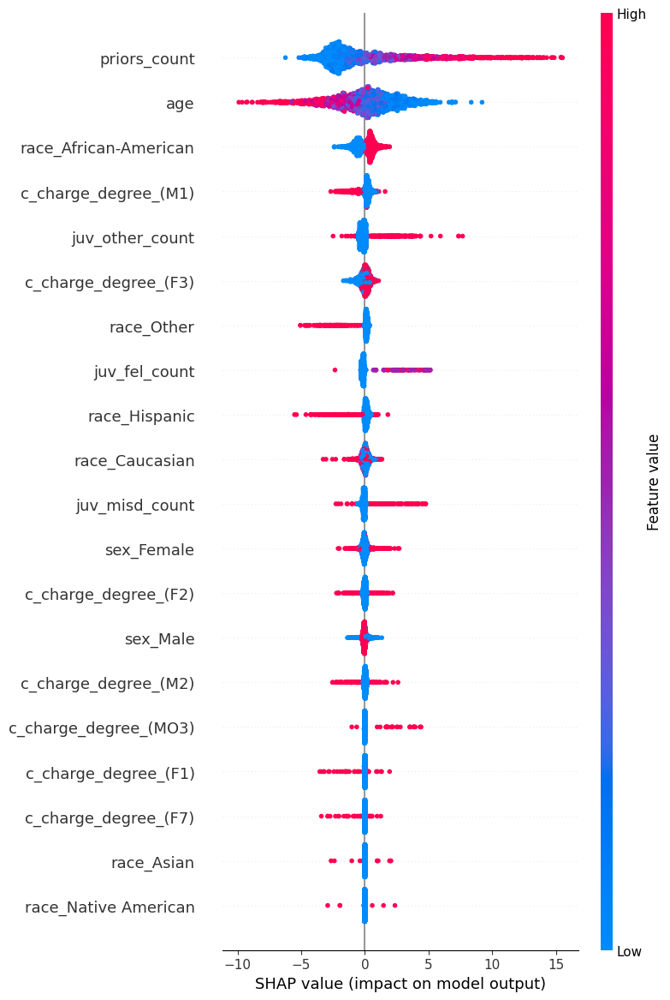

In [ ]:
shap_explainer = shap.TreeExplainer(fitted_cb_mdl)
shap_vals = shap_explainer.shap_values(X_test)
shap.summary_plot(shap_vals, X_test, plot_type="dot", show=False)
fig = plt.gcf()
fig.set_size_inches(8,12)
plt.show()

In [ ]:
col_idx_to_name = dict(zip(list(range(0, X_test.shape[1])),X_test.columns))

#Get feature importance for interaction of features and use dictionary to replace indexes with names.
#Output just the top 10 interactions.
fitted_cb_mdl.get_feature_importance(cb.Pool(X_test, y_test), type='Interaction', prettified=True).\
            replace(col_idx_to_name).\
            rename(columns={'First Feature Index':'Feature 1', 'Second Feature Index':'Feature 2'}).head(10)

,Feature 1,Feature 2,Interaction
0,age,priors_count,24.331867
1,age,race_African-American,3.074049
2,age,race_Caucasian,3.027495
3,age,sex_Female,2.954012
4,age,c_charge_degree_(M1),2.876612
5,age,juv_other_count,2.788380
6,age,c_charge_degree_(F3),2.717352
7,age,c_charge_degree_(M2),2.536704
8,priors_count,race_Caucasian,2.452289
9,priors_count,race_African-American,2.266483


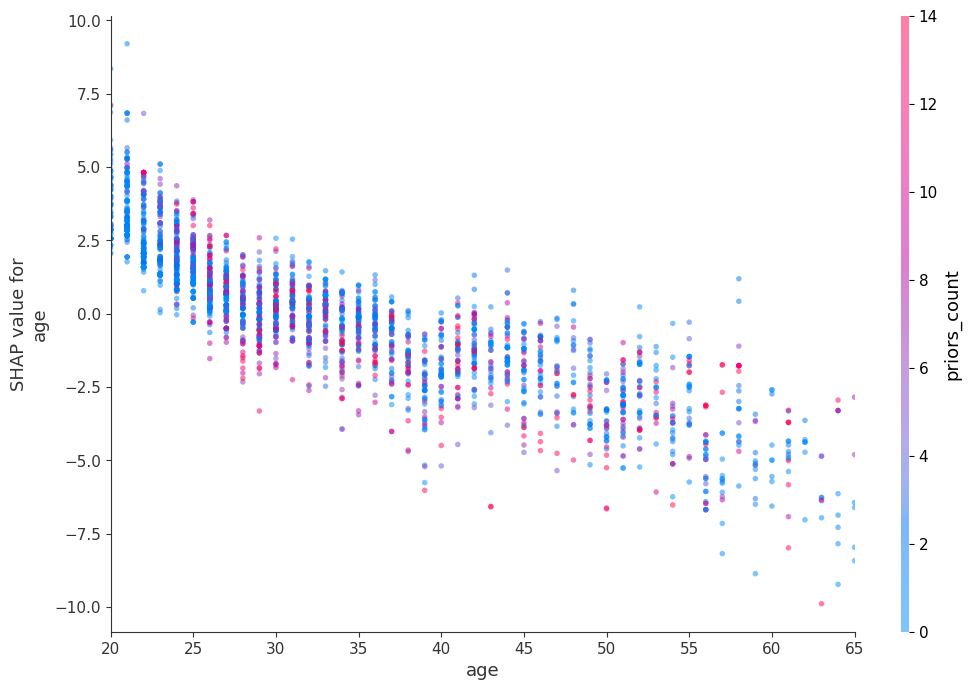

In [ ]:
shap.dependence_plot("age", shap_vals, X_test, interaction_index="priors_count",\
                     show=False, xmin="percentile(1)", xmax="percentile(99)", alpha=0.5)
fig = plt.gcf()
fig.set_size_inches(12,8)
plt.show()

In [ ]:
shap_explainer

In [ ]:
shap.initjs()
shap.force_plot(shap_explainer.expected_value, shap_vals, X_test)

## Instance of Interest

Let's assume we are asked to look into the case of an African-American male defendent with 2 priors and no juvenile offenses, his data point is our instance of interest. To compare, let's also take similar points, except one is Hispanic and another one is Caucasian.

In [ ]:
similarity = (X_test.priors_count==2) & (X_test.juv_fel_count==0) & (X_test.juv_misd_count==0) &\
             (X_test.juv_other_count==0) & (X_test['sex_Male']==1)

#The index of an African-American Defendent (the instance of interest).
aa_idx = X_test[(X_test.age==23) & similarity & (X_test['race_African-American']==1) &\
                (X_test['c_charge_degree_(F7)']==1)].index[0]

#The index of two similar datapoints for and Hispanic and Caucasian defendents.
h_idx = X_test[(X_test.age==23) & similarity & (X_test['race_Hispanic']==1) &\
               (X_test['c_charge_degree_(F3)']==1)].index[0]
c_idx = X_test[(X_test.age==24) & similarity & (X_test['race_Caucasian']==1) &\
               (X_test['c_charge_degree_(M1)']==1)].index[0]

#Create boolean array to easily locate indexes in X_test dataframe.
instance_idxs = X_test.index.isin([aa_idx, h_idx, c_idx])

#Find instances in both X_test and recidivism2_df dataframes.
X_test_instances = X_test[instance_idxs]
X_instances = compas2[compas2.index.isin([aa_idx, h_idx, c_idx])]

#Create a dataframe joining y_test (the `compas_score` label), y_test_cb_pred (the predictions for Catboost),
# X_instances (to get `did_recid`) and X_test (for the rest of the features).
compare_df = pd.concat([\
            pd.DataFrame({'compas_score':y_test[instance_idxs]},\
                         index=[c_idx, h_idx, aa_idx]),\
            pd.DataFrame({'y_pred':Y_pred[instance_idxs]},\
                         index=[c_idx, h_idx, aa_idx]),\
            pd.DataFrame({'did_recid':np.array(X_instances['did_recid'])},\
                         index=[c_idx, h_idx, aa_idx]),\
            X_test_instances], axis=1).set_index([pd.Index(['Caucasian',\
                            'Hispanic', 'African-American'])]).transpose().\
            style.apply(lambda x: ['background: yellow' if (x[2] != x[1] or x[2] != x[0])\
            else '' for i in x], axis=1).apply(lambda x: ['background: lightgreen'\
            if (x.name == 'did_recid') else '' for i in x], axis=1)

compare_df

,Caucasian,Hispanic,African-American
compas_score,0,0,1
y_pred,0,0,1
did_recid,0,0,0
age,24,23,23
juv_fel_count,0,0,0
juv_misd_count,0,0,0
juv_other_count,0,0,0
priors_count,2,2,2
c_charge_degree_(CO3),False,False,False
c_charge_degree_(F1),False,False,False


Let us now use local explanation to understand what is happening to our case. Let's start with **SHAP**

## SHAP

I retrieve the index of my cases for my shapvalues

In [ ]:
X_test_cont = X_test.reset_index(drop=True)
similarity = (X_test_cont.priors_count==2) & (X_test_cont.juv_fel_count==0) & (X_test_cont.juv_misd_count==0) &\
             (X_test_cont.juv_other_count==0) & (X_test_cont['sex_Male']==1)

#The index of an African-American Defendent (the instance of interest).
aa_idx_shap = X_test_cont[(X_test_cont.age==23) & similarity & (X_test_cont['race_African-American']==1) &\
                (X_test_cont['c_charge_degree_(F7)']==1)].index[0]

#The index of two similar datapoints for and Hispanic and Caucasian defendents.
h_idx_shap = X_test_cont[(X_test_cont.age==23) & similarity & (X_test_cont['race_Hispanic']==1) &\
               (X_test_cont['c_charge_degree_(F3)']==1)].index[0]
c_idx_shap = X_test_cont[(X_test_cont.age==24) & similarity & (X_test_cont['race_Caucasian']==1) &\
               (X_test_cont['c_charge_degree_(M1)']==1)].index[0]

In [ ]:
#Providing the names of the classes make for more readable explanations.
class_names = ['Low Risk', 'Medium/High Risk']

**African American**

In [ ]:
shap.initjs()
shap.plots.force(shap_explainer.expected_value, shap_vals[aa_idx_shap], X_test.columns)

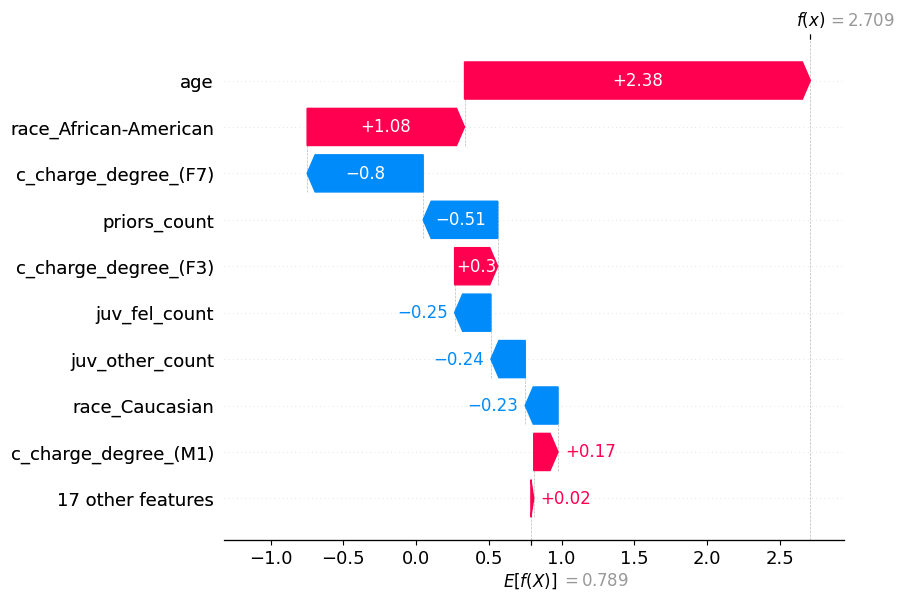

In [ ]:
shap.plots._waterfall.waterfall_legacy(shap_explainer.expected_value,shap_vals[aa_idx_shap],
                                            feature_names=X_test.columns, max_display=10 )

**Caucasian**

In [ ]:
shap.initjs()
shap.plots.force(shap_explainer.expected_value, shap_vals[c_idx_shap], X_test.columns)

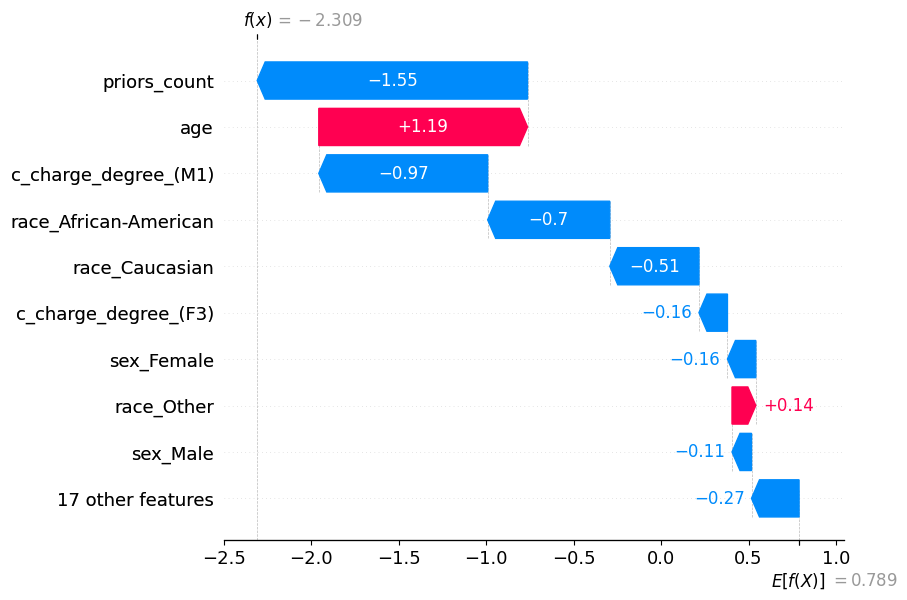

In [ ]:
shap.plots._waterfall.waterfall_legacy(shap_explainer.expected_value,shap_vals[c_idx_shap],
                                            feature_names=X_test.columns, max_display=10 )

**Hispanic**

In [ ]:
shap.initjs()
shap.plots.force(shap_explainer.expected_value, shap_vals[h_idx_shap], X_test.columns)

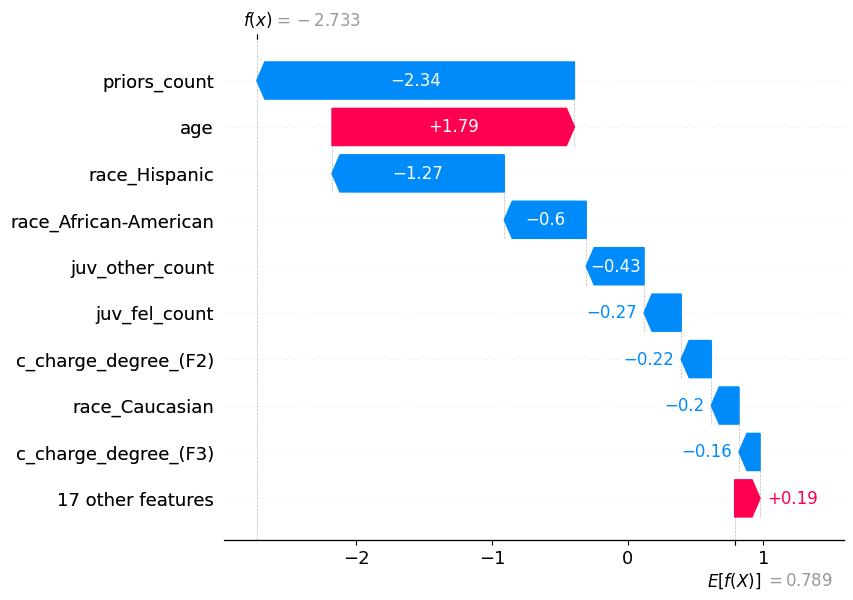

In [ ]:
shap.plots._waterfall.waterfall_legacy(shap_explainer.expected_value,shap_vals[h_idx_shap],
                                            feature_names=X_test.columns, max_display=10 )

## LORE 
from XAILib

In [ ]:
from xailib.models.sklearn_classifier_wrapper import sklearn_classifier_wrapper
from xailib.explainers.lore_explainer import LoreTabularExplainer

In [ ]:
bbox = sklearn_classifier_wrapper(fitted_cb_mdl)

In [ ]:
compas_lore = X_train.merge(y_train,right_index=True, left_index=True)

In [ ]:
explainer = LoreTabularExplainer(bbox)
config = {'neigh_type':'rndgen', 'size':1000, 'ocr':0.1, 'ngen':10}
explainer.fit(compas_lore, 'compas_score', config)

In [ ]:
print('Instance ',X_test.loc[aa_idx].values)
print('Predicted class ',fitted_cb_mdl.predict(X_test.loc[aa_idx].values))
exp = explainer.explain(X_test.loc[aa_idx].values)

Instance  [23 0 0 0 2 False False False False False False True False False False
 False False False True False False False False False False True]
Predicted class  1


In [ ]:
exp.plotRules()

In [ ]:
exp.plotCounterfactualRules()

In [ ]:
print('Instance ',X_test.loc[c_idx].values)
print('Predicted class ',fitted_cb_mdl.predict(X_test.loc[c_idx].values))
exp = explainer.explain(X_test.loc[c_idx].values)

Instance  [24 0 0 0 2 False False False False False False False True False False
 False False False False False True False False False False True]
Predicted class  0


In [ ]:
exp.plotRules()

In [ ]:
exp.plotCounterfactualRules()

In [ ]:
exp.getCounterExemplars()

In [ ]:
print('Instance ',X_test.loc[h_idx].values)
print('Predicted class ',fitted_cb_mdl.predict(X_test.loc[h_idx].values))
exp = explainer.explain(X_test.loc[h_idx].values)

Instance  [23 0 0 0 2 False False False True False False False False False False
 False False False False False False True False False False True]
Predicted class  0


In [ ]:
exp.plotRules()
exp.plotCounterfactualRules()

In [ ]:
exp.getCounterExemplars()

Explaining a model on compas reveals the two major flaws in the data:
- Race plays a major role in a model trained on the data. This is critical for several decisions and represents a problematic assumption.
- Age plays a major role in the decisions of the classifier, interacting heavily with the rest of the features. This could be an undesireble behavior, or something to be adressed in data preparation, possibly discritizing the variable.

## LIME
from XAI-Lib

In [ ]:
from xailib.explainers.lime_explainer import LimeXAITabularExplainer

In [ ]:
lime_cb_explainer = LimeXAITabularExplainer(bbox)

In [ ]:
lime_cb_explainer.fit(compas_lore, 'compas_score', config={})

**African American**

In [ ]:
exp = lime_cb_explainer.explain(X_test.loc[aa_idx].values)

In [ ]:
exp.getFeaturesImportance()

[('priors_count', 0.20270332563864896),
 ('age', -0.15016845879480528),
 ('c_charge_degree_(M1)', -0.02738310740729573),
 ('race_African-American', 0.024101342788970758),
 ('c_charge_degree_(F7)', 0.022727749537672114),
 ('c_charge_degree_(F3)', 0.020806710808523615),
 ('race_Other', -0.020472543173564502),
 ('race_Caucasian', -0.01863632886418283),
 ('sex_Male', 0.0074123562209985824),
 ('sex_Female', 0.006407478563415055)]

In [ ]:
exp.exp.show_in_notebook(predict_proba=True)

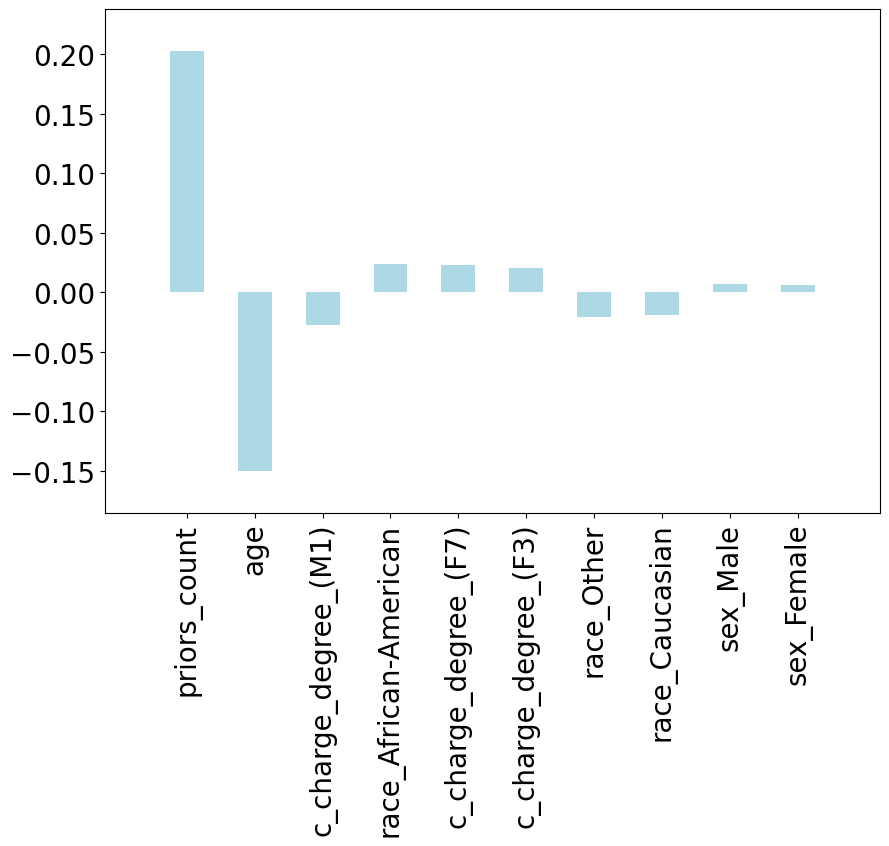

In [ ]:
lime_cb_explainer.plot_lime_values(exp.exp.as_list(), 0, 10)

**Caucasian**

In [ ]:
exp = lime_cb_explainer.explain(X_test.loc[c_idx].values)

In [ ]:
exp.getFeaturesImportance()

[('priors_count', 0.2365838203776462),
 ('age', -0.16015866429028225),
 ('juv_fel_count', 0.04131295070147014),
 ('c_charge_degree_(M1)', -0.036292059256956916),
 ('race_African-American', 0.03222794633941987),
 ('c_charge_degree_(M2)', 0.012973898577333153),
 ('c_charge_degree_(F2)', -0.012866599883842872),
 ('sex_Female', 0.011953818328299193),
 ('sex_Male', -0.004817771873841996),
 ('c_charge_degree_(F3)', 0.003412398388891935)]

In [ ]:
exp.exp.show_in_notebook(predict_proba=True)

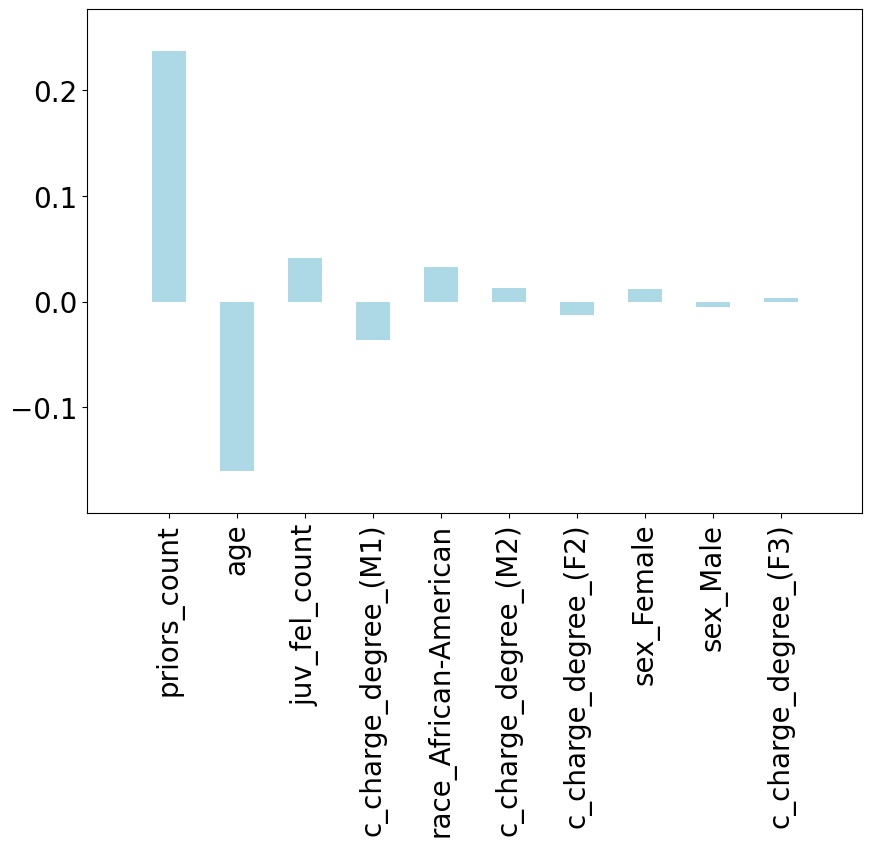

In [ ]:
lime_cb_explainer.plot_lime_values(exp.exp.as_list(), 0, 10)

**Hispanic**

In [ ]:
exp = lime_cb_explainer.explain(X_test.loc[h_idx].values)

In [ ]:
exp.getFeaturesImportance()

[('priors_count', 0.23409955108245267),
 ('age', -0.16819926318108136),
 ('juv_fel_count', 0.05365536091829663),
 ('juv_misd_count', -0.02568211032400953),
 ('race_Hispanic', -0.022387291580475737),
 ('race_African-American', 0.0204079860249267),
 ('sex_Male', -0.019313333425495693),
 ('c_charge_degree_(M1)', -0.017424472975697585),
 ('c_charge_degree_(M2)', -0.014896944800837465),
 ('sex_Female', 0.009214327928310203)]

In [ ]:
exp.exp.show_in_notebook(predict_proba=True)

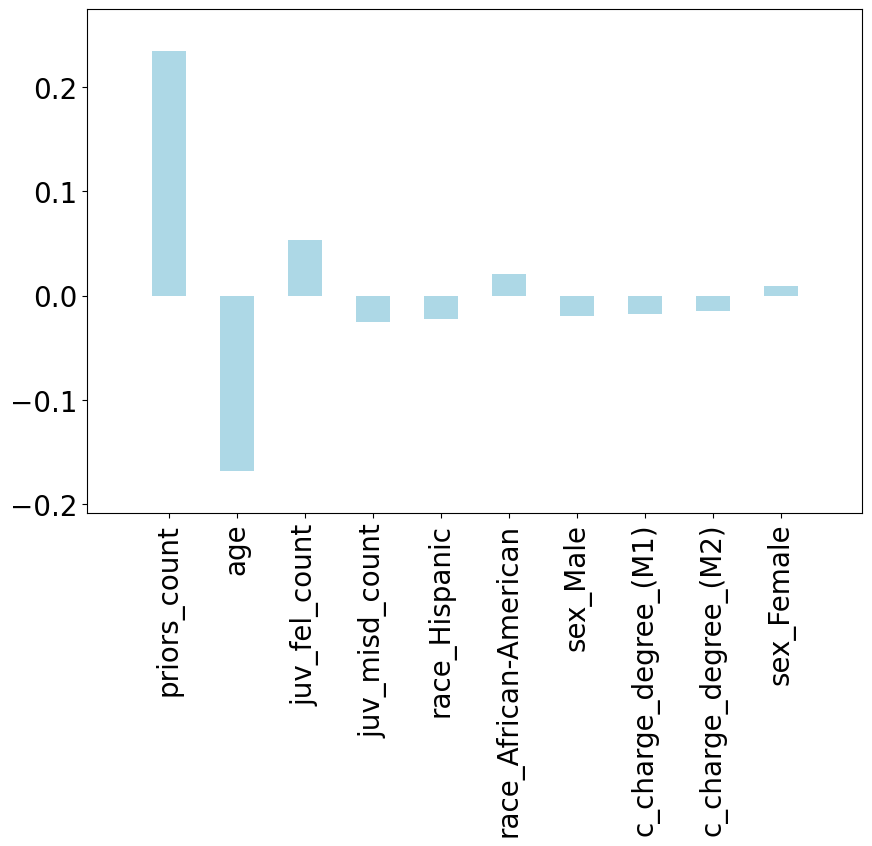

In [ ]:
lime_cb_explainer.plot_lime_values(exp.exp.as_list(), 0, 10)